# Visualizing the "Average" Artwork by Vincent Van Gogh and Others

#### Created: December 16, 2018 || @Author: Kyle Waters


### The images created in this notebook were used in the Artnome Article "New Data Shows Why Van Gogh Changed His Color Palette" which can be found [here](https://www.artnome.com/news/2018/11/26/new-data-shows-why-van-gogh-changed-his-color-palette-to-bright-yellow)

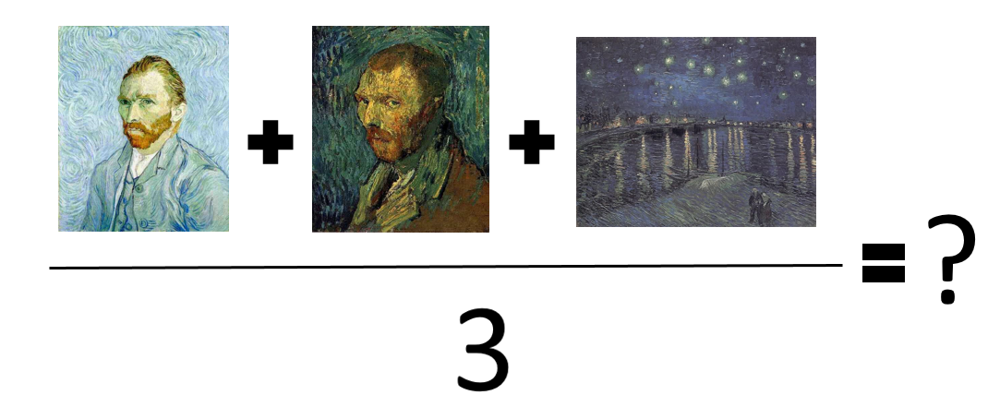

In [7]:
display(load_img(r"CR Images\VanGoghPost2.PNG"))

## Not your Average Joe
### This notebook will explore the complete artworks of Dutch painters Vincent Van Gogh, Piet Mondrian, and Rembrandt, as well as Norweigan painter Edvard Munch, with the goal of creating an "average" painting using all of the available works in the artist's career. 

###  This is not the first instance of creating the "average image" of something. One popular example is from a post which averaged the faces of all 650 U.K. Members of Parliament in 2017. ([link here](https://medium.com/@puntofisso/i-calculated-the-average-face-of-a-uk-member-of-parliament-and-heres-what-i-found-37f31b72b5d9)) Here's what that looked like:<td><img src='https://preview.redd.it/3ul6ekd9urpz.jpg?width=960&crop=smart&auto=webp&s=6b85f95414fbb8d58b434268bea3367c3ea75866' width="200" height="200" align="center"></td>
### There's a lot to be said about the average in this case, and unsurprisingly, this post generated a lot of dialogue. In fact, there is now [an entire subreddit](https://www.reddit.com/r/AveragePics) devoted to averaging pics where you can find - among other things - the "average" U.S. President, Game of Thrones character, or Premier League player. 

### Returning back to art, I believe it is a great genre to create average images. There are so many ways to partition an artist's paintings besides the overall average. For example, what does the average portrait look like? Or the average of the top-10 highest selling works at auction? I'll try to answer those questions and more.


In [2]:
""" Import Libraries """
import numpy as np
import pandas as pd
import os
import requests
import time
from IPython.display import Image
from IPython.core.display import HTML 
from IPython.display import HTML, display
from selenium import webdriver
#from skimage.io import imread
from io import BytesIO
from PIL import Image
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from tensorflow.python.keras.applications.resnet50 import preprocess_input
from tensorflow.python.keras.preprocessing.image import load_img, img_to_array, array_to_img
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt  
from requests.auth import HTTPBasicAuth

C:\Users\kwaters\Documents\Python\envs\py36\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


### Note about my choice of libraries
#### I'll be using Keras' image preprocessing tools. There are certainly many other ways to work with images in Python, OpenCV being an obvious choice, but for now I'll take a simple approach. 

# 1. Vincent Van Gogh

### To start off, we'll explore Vincent Van Gogh's paintings. He has a quality Catalogue Raisonne, which is a comprehensive record of every painting he completed in his life. 

### First, I pulled all of Van Gogh's paintings from the website http://www.vggallery.com 

In [5]:
mainurls = ['ac','df','gi','jl','mo','pr','su','vz'] 

In [ ]:
num = 0
for letters in mainurls:
    url = r'http://www.vggallery.com/painting/main_{}.htm'.format(letters)
    browser.get(url)
    index = 1
    
    while True:
        
        index += 1
        
        try:
            xpath_link = r'/html/body/p[6]/table/tbody/tr[{}]/td[1]/a/b'.format(index)
            browser.find_element_by_xpath(xpath_link).click()
        except:
            break
        
        num += 1
        current_url = browser.current_url
        r = requests.get(browser.current_url)
        doc = r.text
        soup = BeautifulSoup(doc, 'html.parser')

        for i in soup.find_all('img'):
            if "f_" in str(i):
                end_src = i.get_attribute_list('src')[0]
                src = 'http://www.vggallery.com/painting/' + end_src
                req = requests.get(src)
                im = Image.open(BytesIO(req.content))

                ext = str(num) + '.jpg'
                folder = r"\Catalogue Raissone\Van GoghV2"
                image_name = os.path.join(folder, ext)
                #print(image_name)
                im.save(image_name)
                break
                
        browser.back()

### Import the data once we finish the webscraping

In [8]:
df_vangogh = pd.read_csv(r"...\vangogh_images.csv",encoding = "ISO-8859-1")

In [9]:
df_vangogh['TitleLower'] = df_vangogh.Title.map(lambda x: x.lower())

# Finding the "Average" Painting by Vincent Van Gogh

### Van Gogh's career lasted a little under a decade from 1881 to 1890 and he painted 860 oil paintings in this time. Here, we're going to visualize what the average of those 860 paintings looks like. 

#### To do this, I'll first load each painting as a 400 pixel by 400 pixel array (note this may misconstrue paintings that are long or wide).  I then do array-level addition and keep adding the images together until I finally divide out by the number of paintings. 

In [79]:
def get_average_painting_all():
    
    """
    Load Van Gogh's Paintings as 400x400x3 numpy arrays and average them 
    """
    
    num_paintings = 0
    full_array = np.zeros([400, 400, 3])
    for path in df_vangogh['img_path'].values:
        
        try:
            img = load_img(path, target_size=(400,400))
            num_paintings += 1
            _array = img_to_array(img)
            full_array = full_array + _array 
        except:
            pass
    return(array_to_img(full_array/num_paintings), 'There are {} paintings averaged'.format(num_paintings), full_array/num_paintings)

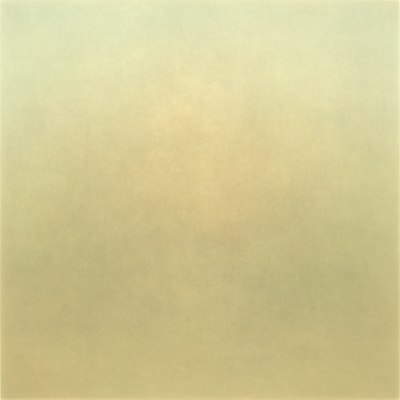

In [5]:
average = get_average_painting_all()
display(average[0])

### Above is the "average" Van Gogh painting. This makes sense given Van Gogh's yellow-dominated color palette. But given the different types of his artworks (e.g., portrait, landscape) we can only tell dominant color from this amalgamation of paintings.

### We can now find the average for specific types of paintings, like self portraits based on the text in the title

In [10]:
def get_average_painting_title_search(search_term):
    
    """
    Average based on title text search
    """
    
    df_vangogh[search_term] = df_vangogh.TitleLower.map(lambda x: 1 if search_term in x else 0)
    
    num_paintings = 0
    full_array = np.zeros([400, 400, 3])
    for path in df_vangogh[df_vangogh[search_term] == 1]['img_path'].values:
        num_paintings += 1 
        img = load_img(path, target_size=(400,400))
        _array = img_to_array(img)
        full_array = full_array + _array 
    return(array_to_img(full_array), 'There are {} paintings averaged'.format(num_paintings), full_array/num_paintings)

### What are the most common words in Van Gogh's paintings's titles?

In [36]:
''' Create a dataframe with all of the words in the titles '''
df = pd.DataFrame()
count = 0
for title in df_vangogh.TitleLower.apply(lambda x: x.split()).values:

    for word in title:
        count += 1
        df.loc[count, 'Word'] = word

In [51]:
most_common_words = df.groupby("Word").Word.count().sort_values(ascending=False)
most_common_words.head(25)

Word
with             306
the              236
of               221
a                169
in               147
and               96
still             87
woman             83
at                81
peasant           78
life              58
vase              52
head              49
portrait          43
two               38
wheat             38
self-portrait     35
garden            34
field             34
cap               34
trees             31
life:             29
(after            28
white             26
de                24
Name: Word, dtype: int64

# Average Van Gogh Self Portraits

### Van Gogh painted 35 self portraits of himself at different points in his life. These self portraits are some of his most ubiquitous works, recognizable by many.  What might the "average" look like?

There are 35 paintings averaged


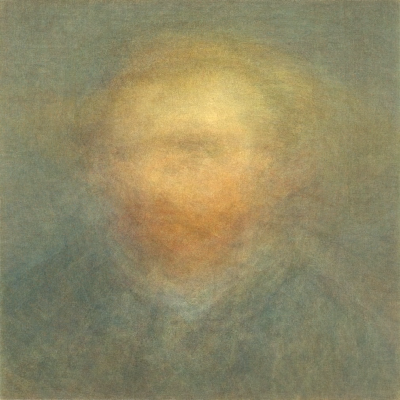

In [23]:
print(get_average_painting_title_search("self-portrait")[1])
get_average_painting_title_search("self-portrait")[0]

## Above is the average Van Gogh self portait. Interestingly, we can make out his facial features as well as his tendency to paint himself donning a hat.

## Average Painting of Flowers and Fields

There are 38 paintings averaged


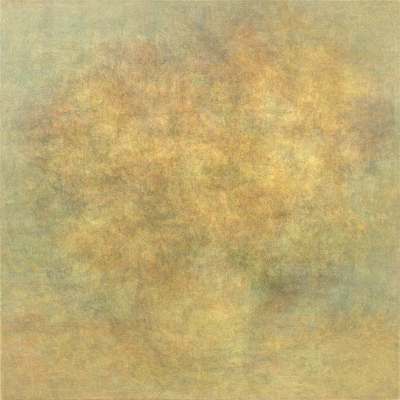

In [43]:
print(get_average_painting_title_search("flower")[1])
get_average_painting_title_search("flower")[0]

There are 48 paintings averaged


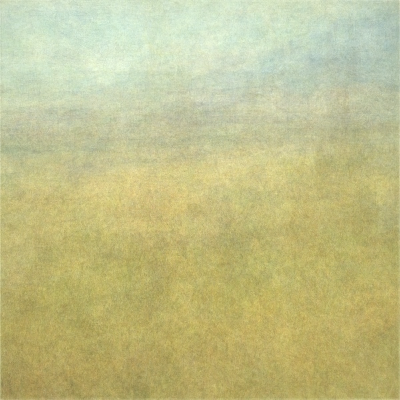

In [52]:
print(get_average_painting_title_search("field")[1])
get_average_painting_title_search("field")[0]

### But why just stop at the average? We can extend this to other statistics, like a variance or standard deviation which captures the spread of the data from the average. 

In [84]:
def get_variance_painting_all(titlesearch=None):
    num_paintings = 0
    squared_errors = np.zeros([400, 400, 3])
    
    if titlesearch is not None:
        average_vangogh = get_average_painting_title_search(titlesearch)[2]
    else:
        average_vangogh = get_average_painting_all()[2]
        
    for path in df_vangogh['img_path'].values:
        try:
            img = load_img(path, target_size=(400,400))
            num_paintings += 1
            _array = img_to_array(img)
            squared_errors = squared_errors + ((_array - average_vangogh) ** 2)
        except:
            pass
    #Average of the squared deviations from the mean
    return(array_to_img(squared_errors/num_paintings), 'There are {} paintings averaged'.format(num_paintings))     

In [6]:
def get_stddev_painting_all():
    num_paintings = 0
    squared_errors = np.zeros([400, 400, 3])
    average_vangogh = get_average_painting_title_search('self-portrait')[2]
    for path in df_vangogh['img_path'].values:
        try:
            img = load_img(path, target_size=(400,400))
            num_paintings += 1
            _array = img_to_array(img)
            squared_errors = squared_errors + ((_array - average_vangogh) ** 2)
        except:
            pass
    return(array_to_img(np.sqrt(squared_errors/num_paintings)), 'There are {} paintings averaged'.format(num_paintings), np.sqrt(squared_errors/num_paintings))     

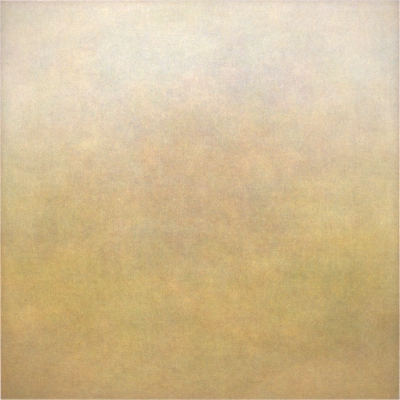

In [85]:
average = get_variance_painting_all()
display(average[0])

###  For self portraits

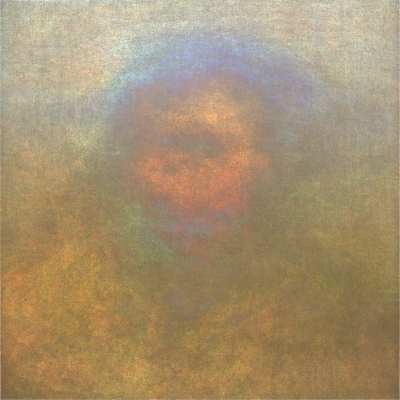

In [53]:
average = get_variance_painting_all(titlesearch="self-portrait")
display(average[0])

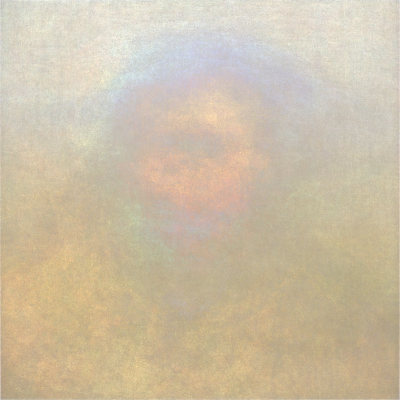

In [57]:
average = get_stddev_painting_all()
display(average[0])

### Because these are measures of spread, the areas with more intense colors are the areas where you find differences among the portraits. One thing I think I'm capturing here is that Van Gogh doesn't always wear a hat in his self portraits

### Another measure we can look at is the Skewness, which captues asymmetry in the data

In [54]:
def get_skewness_painting_all():
    num_paintings = 0
    cubed_errors = np.zeros([400, 400, 3])
    average_vangogh = get_average_painting_title_search('self-portrait')[2]

    for path in df_vangogh['img_path'].values:
        try:
            img = load_img(path, target_size=(400,400))
            num_paintings += 1
            _array = img_to_array(img)
            cubed_errors = cubed_errors + ((_array - average_vangogh) ** 3)
        except:
            pass
    return(array_to_img(cubed_errors/num_paintings), 'There are {} paintings averaged'.format(num_paintings))     

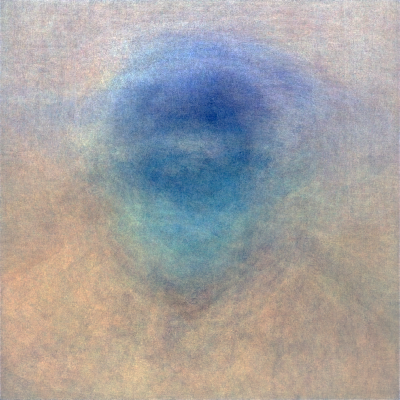

In [55]:
average = get_skewness_painting_all()
display(average[0])

## Getting the most similar and different of Van Gogh's paintings

### Which paintings are most alike to the average and far away from it? For each painting, I find the average absolute deviation from the average painting and the painting with the minimum and maximum deviations are the most similar and most different from the average.

In [57]:
def get_max_abs_error_painting_all():
    
    num_paintings = 0
    
    painting_errors = []
    average_vangogh = get_average_painting_all()[0]
    for path in df_vangogh['img_path'].values:
        
        try:
            img = load_img(path, target_size=(400,400))
            _array = img_to_array(img)
            num_paintings += 1
            
            mean_abs_error = np.mean(abs(_array - average_vangogh))
            painting_errors.append(mean_abs_error)

        except:
            painting_errors.append(mean_abs_error)
            
    error_max = max(painting_errors)
    error_min = min(painting_errors)
    most_diff = load_img(df_vangogh.img_path.iloc[painting_errors.index(max(painting_errors))],target_size=(400,400))
    most_similar = load_img(df_vangogh.img_path.iloc[painting_errors.index(min(painting_errors))],target_size=(400,400))
        
    return(most_diff, most_similar, error_max, error_min, 'There are {} paintings averaged'.format(num_paintings), full_array/num_paintings)

165.82454 28.586226


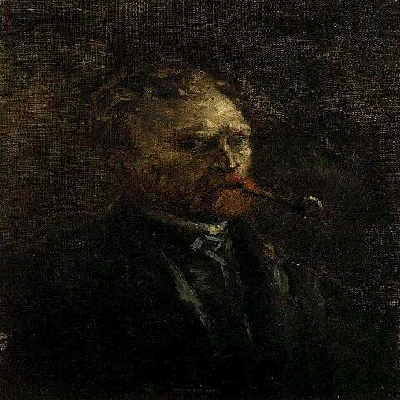

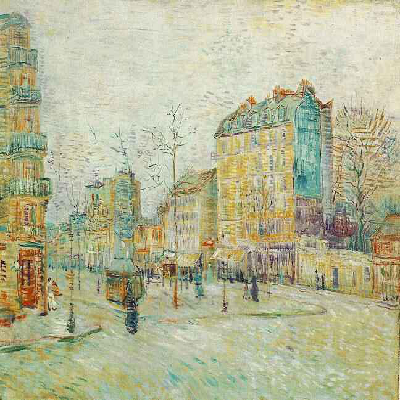

In [58]:
most_diff = get_max_abs_error_painting_all()
print(most_diff[2],most_diff[3])
display(most_diff[0])
display(most_diff[1])

### The first image is an especially dark painting which was not characteristic of Van Gogh's yellow-dominated palette. The average pixel is 166 RGBs from the mean. 

### The second painting fits Van Gogh's color palette better, the average pixel is only 29 RGBs away from the mean.

# How does the average vary by location and time?

### Van Gogh moved around and painted in various areas of France, the Netherlands, and Belgium.

In [61]:
df_vangogh['date'] = df_vangogh['Location / Date'].map(lambda x: x[x.find(',')+2:])

In [62]:
df_vangogh['location'] = df_vangogh['Location / Date'].map(lambda x: x[:x.find(':')])

In [63]:
location_counts = pd.value_counts(df_vangogh['location'])
print(location_counts)
unique_locations = location_counts.index

Paris                         224
Nuenen                        188
Arles                         186
Saint-Remy                    143
Auvers-sur-Oise                76
The Hague                      29
Antwerp                         8
Drente                          3
Nieuw-Amsterdam                 3
Scheveningen                    1
Amsterdam                       1
Arles, early December, 188      1
Auvers-sur-Oise, June, 189      1
Name: location, dtype: int64


In [64]:
def get_average_location(location):
    place_df = df_vangogh.loc[df_vangogh.location == location]
    
    num_paintings = 0
    full_array = np.zeros([400, 400, 3])
    for i in range(len(place_df)):
        try:
            num_paintings += 1
            img = load_img(place_df.img_path.iloc[i], target_size=(400,400))
            _array = img_to_array(img)
            full_array = full_array + _array
        except:
            pass
        
    return(array_to_img(full_array), 'There are {} paintings averaged'.format(num_paintings))

This is the average for Paris
There are 224 paintings averaged


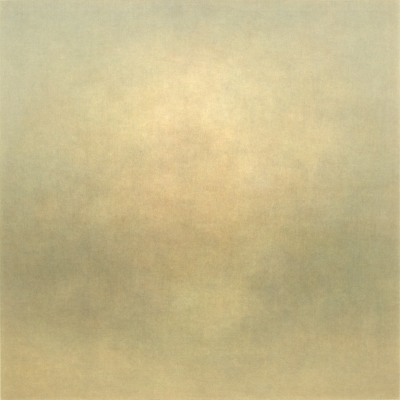

This is the average for Nuenen
There are 188 paintings averaged


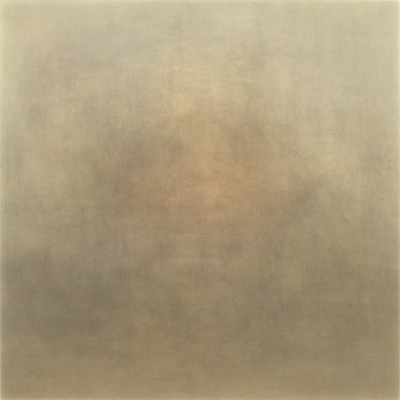

This is the average for Arles
There are 186 paintings averaged


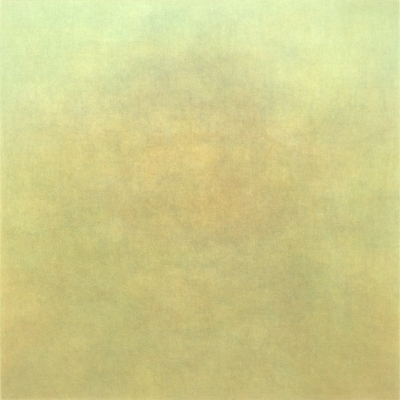

This is the average for Saint-Remy
There are 143 paintings averaged


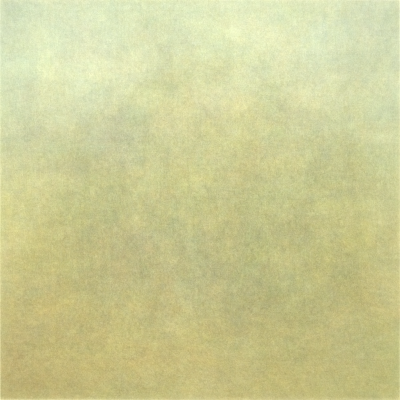

This is the average for Auvers-sur-Oise
There are 76 paintings averaged


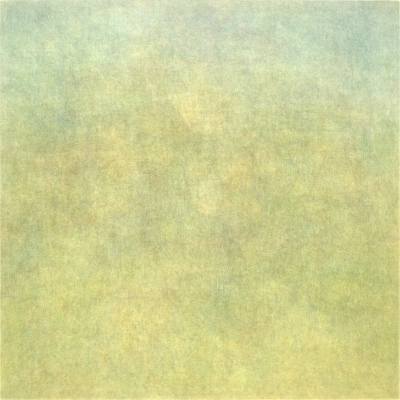

This is the average for The Hague
There are 29 paintings averaged


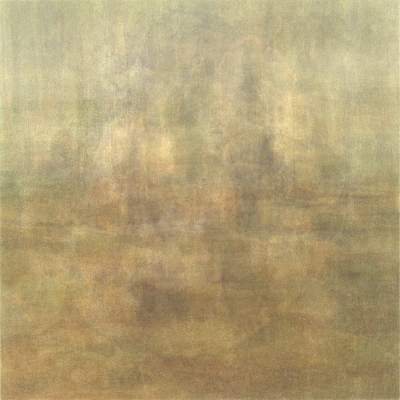

This is the average for Antwerp
There are 8 paintings averaged


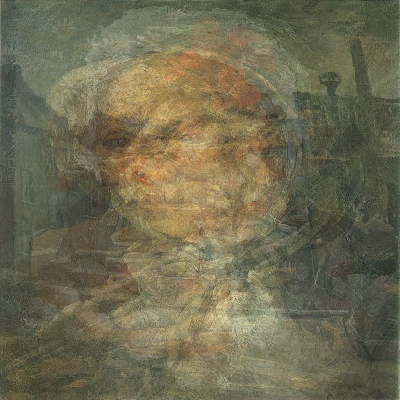

This is the average for Drente
There are 3 paintings averaged


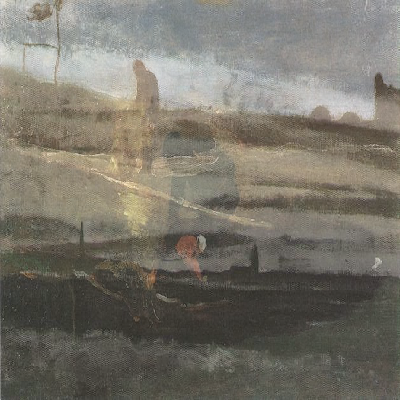

This is the average for Nieuw-Amsterdam
There are 3 paintings averaged


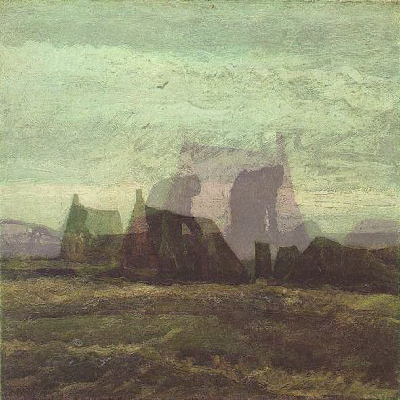

This is the average for Scheveningen
There are 1 paintings averaged


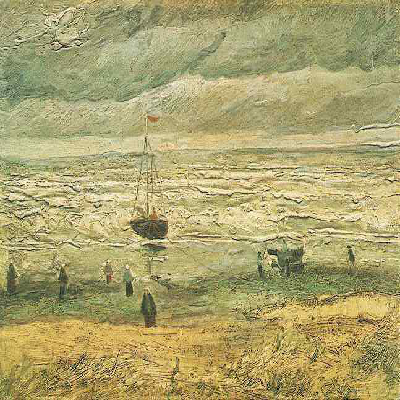

This is the average for Amsterdam
There are 1 paintings averaged


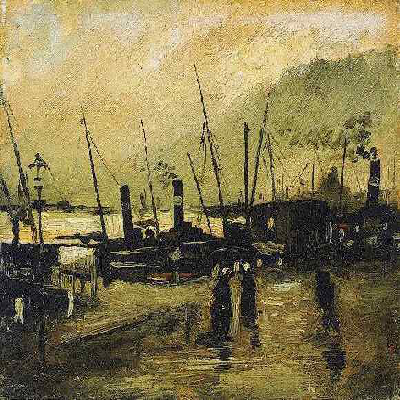

This is the average for Arles, early December, 188
There are 1 paintings averaged


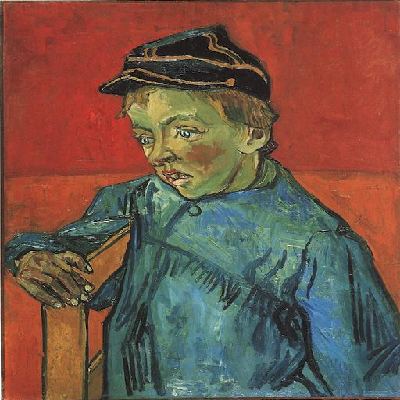

This is the average for Auvers-sur-Oise, June, 189
There are 1 paintings averaged


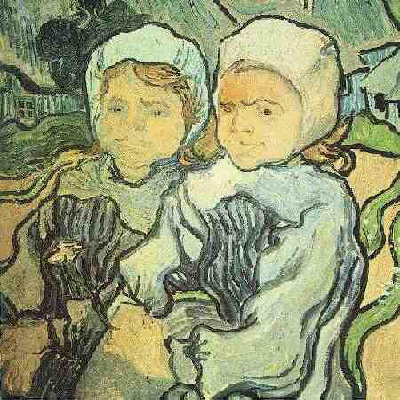

In [65]:
for location in unique_locations:
    print("This is the average for {}".format(location))
    print(get_average_location(location)[1])
    display(get_average_location(location)[0])

In [66]:
df_vangogh['date_'] = df_vangogh['date'].map(lambda s: int(s) if s.isdigit() else 'NaN')

In [67]:
bydates_vangogh = df_vangogh[(df_vangogh.date_ != 'NaN') & (pd.notnull(df_vangogh.img_path))]

## How does the average vary by time?

In [68]:
def get_first_half():
    vangogh_sorted = bydates_vangogh.sort_values(by='date_')
    
    firsthalf = 406
        
    full_array = np.zeros([400, 400, 3])
    for i in range(firsthalf):
        #print(vangogh_sorted.img_path.iloc[i])
        img = load_img(vangogh_sorted.img_path.iloc[i], target_size=(400,400))
        _array = img_to_array(img)
        full_array = full_array + _array
        
    return(array_to_img(full_array))
        

In [69]:
def get_second_half():
    vangogh_sorted = bydates_vangogh.sort_values(by='date_')
    
    secondhalf = 406
        
    full_array = np.zeros([400, 400, 3])
    for i in range(len(vangogh_sorted)):
        if i < secondhalf:
            
            pass
        else:
            #print(vangogh_sorted.img_path.iloc[i])
            img = load_img(vangogh_sorted.img_path.iloc[i], target_size=(400,400))
            _array = img_to_array(img)
            full_array = full_array + _array
        
    return(array_to_img(full_array))
        

In [70]:
def get_average_year(year):
    year_df = bydates_vangogh.loc[bydates_vangogh.date_ == year]
    
    full_array = np.zeros([400, 400, 3])
    for i in range(len(year_df)):
        img = load_img(year_df.img_path.iloc[i], target_size=(400,400))
        _array = img_to_array(img)
        full_array = full_array + _array
        
    return(array_to_img(full_array))

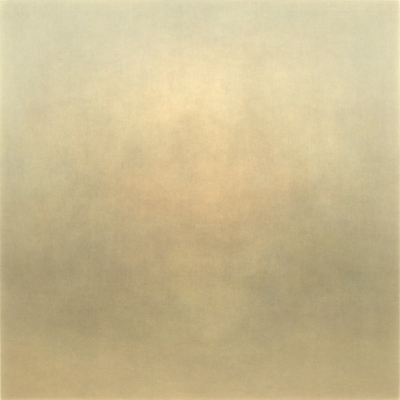

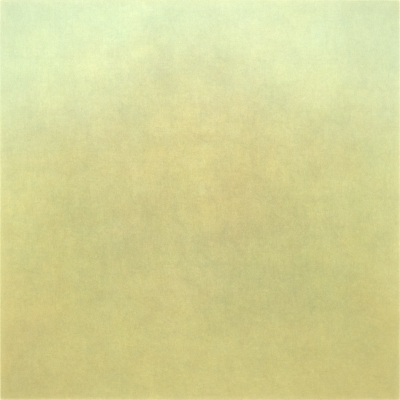

In [32]:
firstHALF_vangoh = get_first_half()
secondhalf = get_second_half()
display(firstHALF_vangoh)
display(secondhalf)

1888    151
1889    141
1885    135
1890    108
1887    105
1886     87
1884     51
1883     19
1882     12
1881      3
Name: date_, dtype: int64

This is the average for 1888


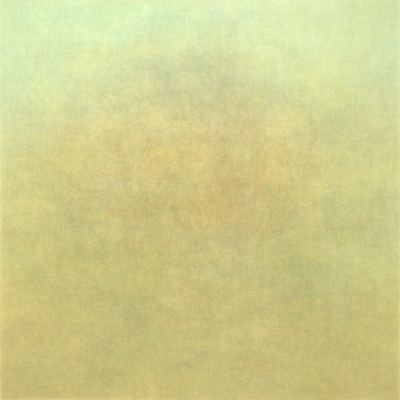

This is the average for 1889


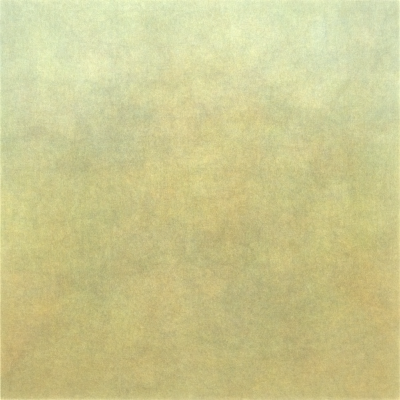

This is the average for 1885


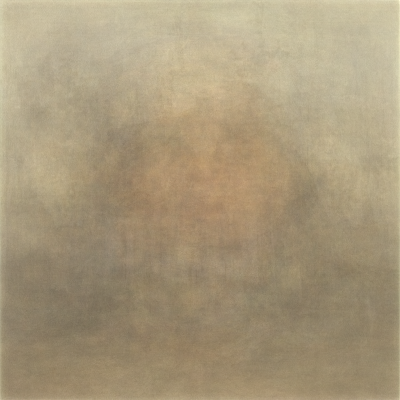

This is the average for 1890


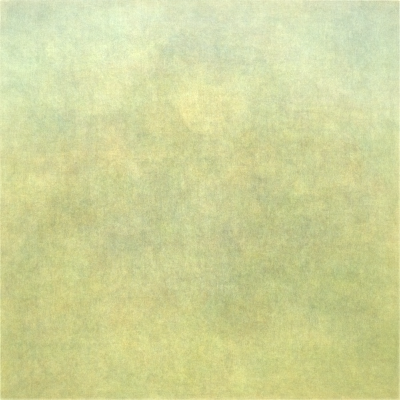

This is the average for 1887


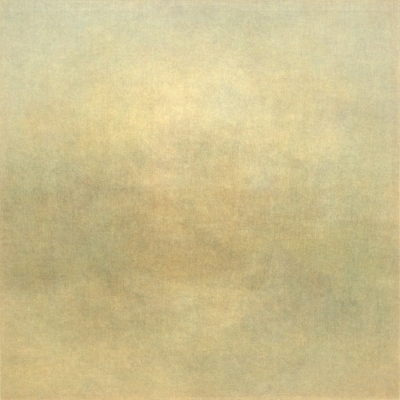

This is the average for 1886


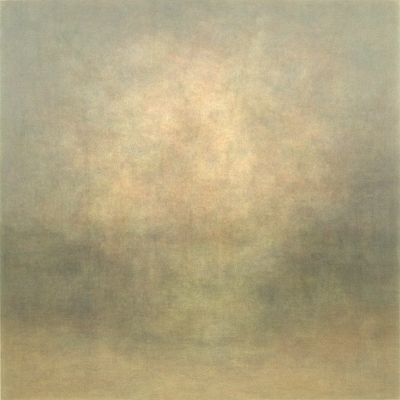

This is the average for 1884


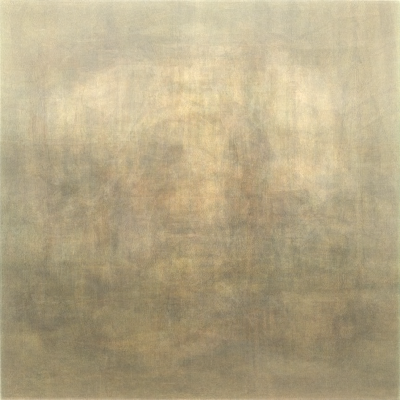

This is the average for 1883


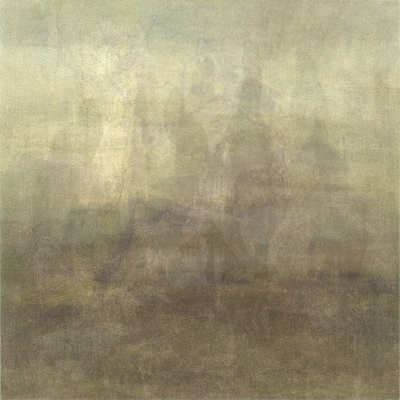

This is the average for 1882


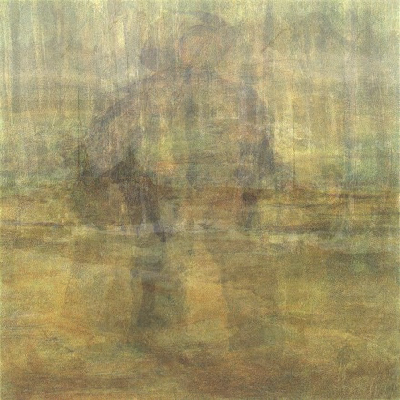

This is the average for 1881


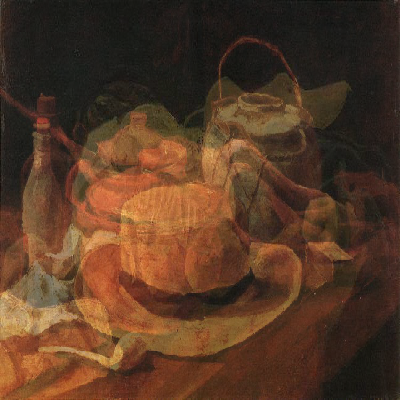

In [30]:
years_count = pd.value_counts(bydates_vangogh.date_)
display(years_count)
unique_years = years_count.index

for year in unique_years:
    print("This is the average for {}".format(year))
    display(get_average_year(year))

## It seems that his paintings were brighter when he was located in sunnier climates, this is a theory we explore in the Artnome Article "New Data Shows Why Van Gogh Changed His Color Palette" which can be found [here](https://www.artnome.com/news/2018/11/26/new-data-shows-why-van-gogh-changed-his-color-palette-to-bright-yellow)


## What does the average look like for the top 10 records?

In [72]:
df_records = pd.read_csv(r"\df_records_11_23_18.csv")

C:\Users\kwaters\Documents\Python\envs\py36\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (1,3,4,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [73]:
vangogh = df_records.loc[(df_records.artist_name == 'Vincent Van Gogh') & (pd.notnull(df_records.hammer_price))]

In [74]:
sorted_by_hammer = vangogh.sort_values(by='hammer_price', ascending=False)

Price: $75,000,000.0


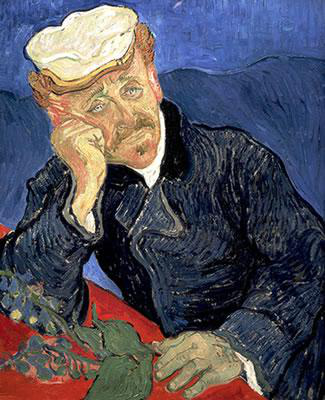

Price: $72,277,777.7778


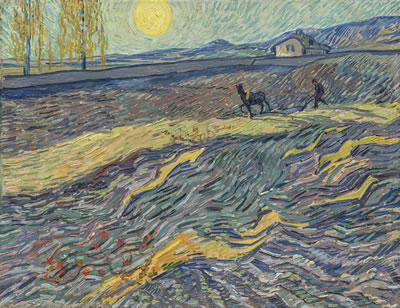

Price: $65,002,272.7273


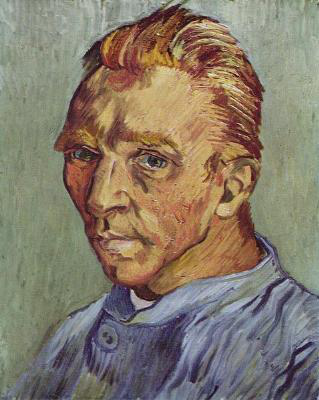

Price: $59,223,214.2857


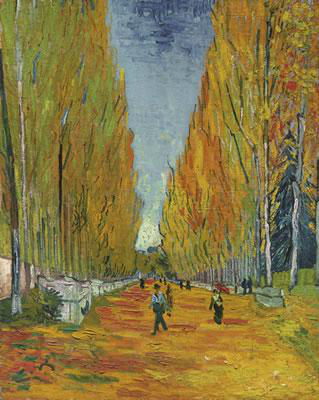

Price: $55,147,321.4286


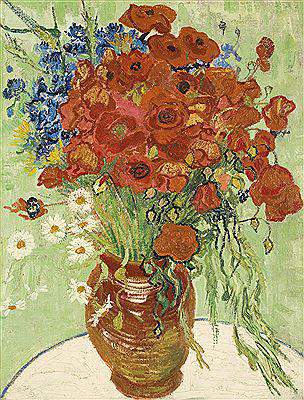

Price: $49,000,000.0


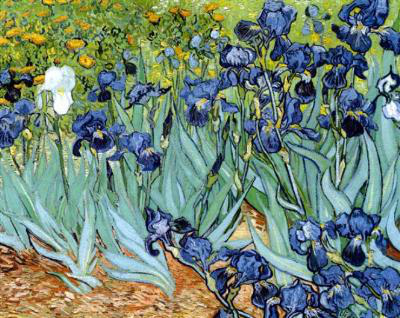

Price: $48,223,214.2857


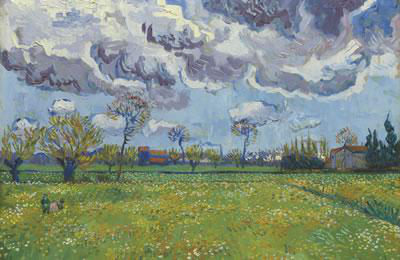

Price: $36,014,285.7143


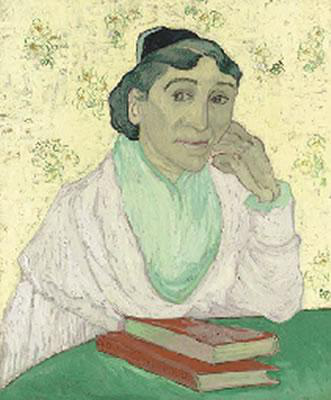

Price: $35,277,777.7778


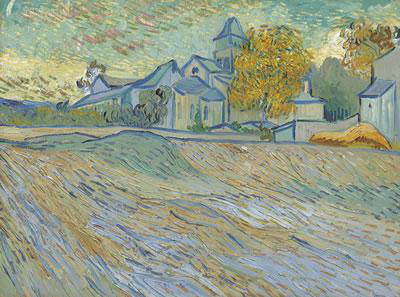

Price: $27,574,357.1429


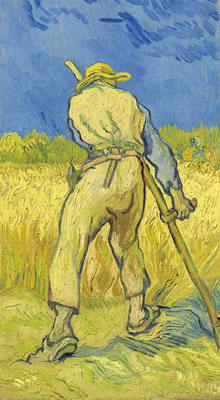

52274022.114010006


In [77]:
full_array = np.zeros([400, 400, 3])
avgprice = 0
for i in range(10):
    avgprice = avgprice + sorted_by_hammer.hammer_price.iloc[i]
    print("Price: ${:,}".format(sorted_by_hammer.hammer_price.iloc[i]))
    display(load_img(sorted_by_hammer.path_to_image.iloc[i]))
    img = load_img(sorted_by_hammer.path_to_image.iloc[i], target_size=(400,400))
    _array = img_to_array(img)
    full_array = full_array + _array
print(avgprice/10)

### And the average of those 10....

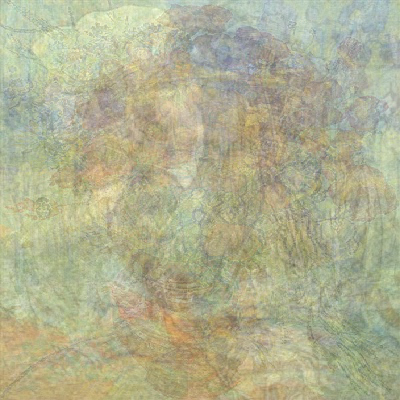

In [76]:
array_to_img(full_array/10)

# 2. Piet Mondrian

In [59]:
full_array = np.zeros([400, 400, 3])
for i in range(1289):
    
    if i > -1 and i < 1500:
        path = r'CR Images\Mondrian\{}.jpg'.format(i+1)
        try:
            img = load_img(path, target_size=(400,400))
            _array = img_to_array(img)
            full_array = full_array + _array
        except:
            pass
    else:
        pass

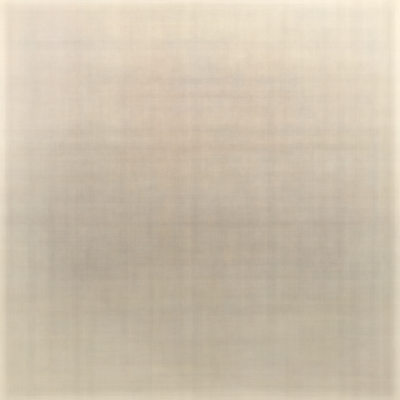

In [60]:
display(array_to_img(full_array))

# 3. Munch (Self Portraits)

In [46]:
full_array = np.zeros([400, 400, 3])
for i in range(46):
    path = r'Munch_self_portraits\{}.jpg'.format(i+1)
    try:
        img = load_img(path, target_size=(400,400))
        _array = img_to_array(img)
        full_array = full_array + _array
    except:
        pass

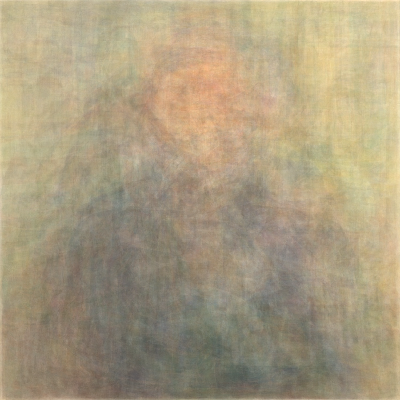

In [47]:
display(array_to_img(full_array))

# 4. Rembrandt (Self Portraits)

In [2]:
df_rembrandt = pd.read_excel(r"\Artnome Articles\rembrandt_paths.xlsx")

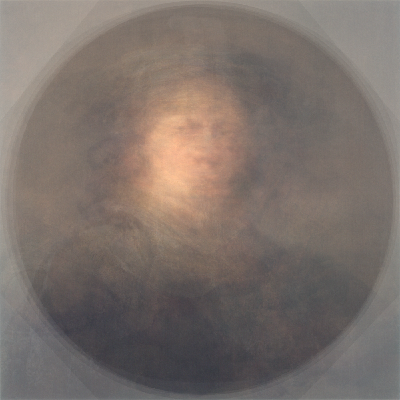

In [8]:
num_paintings = 0
full_array = np.zeros([400, 400, 3])
for path in df_rembrandt['Path'].values:

    try:
        img = load_img(path, target_size=(400,400))
        num_paintings += 1
        _array = img_to_array(img)
        full_array = full_array + _array 
    except:
        pass
display(array_to_img(full_array/num_paintings))

In [9]:
print(num_paintings)

37
